# Visualising Datasets 

There are several tools that allow us to visualize the data on a map. In this notebook, we will focus on **OSMnx**, a Python package that lets you download geospatial data from **OpenStreetMap** and model, project, visualize, and analyze real-world street networks and any other geospatial geometries. More precisly, you can:

- Download and model street networks or other networked infrastructure anywhere in the world
- Download any other spatial geometries, place boundaries, building footprints, or points of interest as a GeoDataFrame
- Download by city name, polygon, bounding box, or point/address + network distance
- Download drivable, walkable, bikeable, or all street networks
- Fast map-matching of points, routes, or trajectories to nearest graph edges or nodes
- Save networks to disk as shapefiles, GeoPackages, and GraphML
- Calculate and visualize street bearings and orientations
- Calculate and visualize shortest-path routes that minimize distance, travel time, elevation, etc
- Visualize travel distance and travel time with isoline and isochrone maps
- Plot figure-ground diagrams of street networks and building footprints

For more informations, have a look at [the official documentation](https://python-visualization.github.io/folium/) and the [usage examples, demos, and tutorials for OSMnx.](https://github.com/gboeing/osmnx-examples)

## Needed packages <a class="anchor" id="chapter1"></a>

In [3]:
!pip install osmnx
!pip install mpld3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.2/201.2 kB 5.1 MB/s eta 0:00:00


In [4]:
import osmnx as ox
import matplotlib.pyplot as plt

import mpld3
mpld3.enable_notebook() # enable zooming in inline plots

## Concrete case study: modal shift with focus on micro mobility (Leuven)

In this example, we will focus on micro mobility in Leuven.

The modal shift is part of Leuven’s long term policy plans and can be seen as a challenge on its own. Modal splits and monitoring of the modal splits is not so easy, which translates in many projects and many plans aiming to get more people on public transport, on the bike, on new mobility and to encourage the combination of modes. The modal share of shared mobility services is not high yet, compared to walking or private vehicles (motorized and non-motorized).

Each city has its own characteristics, and Leuven has a lot of students with high bike use for internal movements. Plus, most inhabitants have their own bikesThe city of Leuven has been working on mobility plans regarding cycling lanes and cycling streets, but there is still room for improvement.

The challenge here is to study, based on the available data, the good criterias (Housing, real estate, etc.) to decide where traffic lanes are needed. 
The aim is to provide a general framework helping decision-making on very objective data.

### Importing data from OpenStreetMap

First, we specify the location from OSM nominatim and visualize the area. a 'node' above refers to the intersection of two or more streets, while an 'edge' refers to a single street connecting two (or more) intersections.

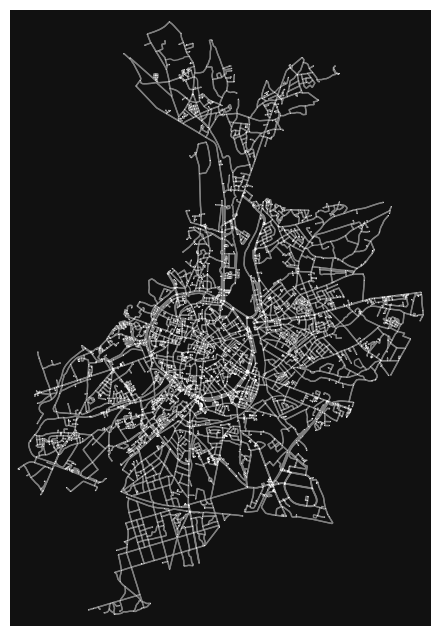

In [5]:
# Specify the name that is used to seach for the data
place_name = "Leuven, Belgium"

# Fetch OSM street network from the location
graph = ox.graph_from_place(place_name, network_type='bike', simplify=True) #Simplifies graph topology by removing all nodes that are not intersections or dead-ends

# Plot the streets
# the plot will get a toolbar menu at the bottom left, in which you can enable mouse zooming
fig, ax = ox.plot_graph(graph, node_size=0.5, edge_color='grey') 

Here, we get the Edges (street network) and the place name (Leuven, Belgium) into a GeoDataFrame

<Axes: >

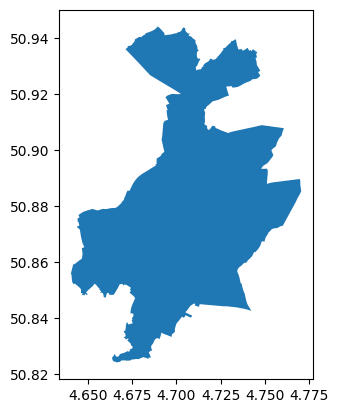

In [6]:
# Retrieve nodes and edges
nodes, edges = ox.graph_to_gdfs(graph)

# Get place boundary related to the place name as a geodataframe
area = ox.geocode_to_gdf(place_name)
area.plot()

After that, we get the buildings's geometry with tags and place name as GeoDataFrame. If you are interested to find more geometric objects to retrieve from OSM, have a look at [the OSM Wiki for buildings tags.](https://wiki.openstreetmap.org/wiki/Buildings) You can use tags to retrieve cafes, markets, parking lots, etc.

In [7]:
# List key-value pairs for tags
tags = {'building': 'university', 'building': 'school'}
buildings = ox.geometries_from_place(place_name, tags)

In [8]:
# List key-value pairs for tags
tags = {'amenity': 'bicycle_parking'}
# Get the data
parks = ox.geometries_from_place(place_name, tags)

Now let's plot altogether. In the whole area. Once again, you can zoom in a specific area by using the toolbar menu at the bottom left.

(4.633783225, 4.7770422749999994, 50.818216545000006, 50.950063754999995)

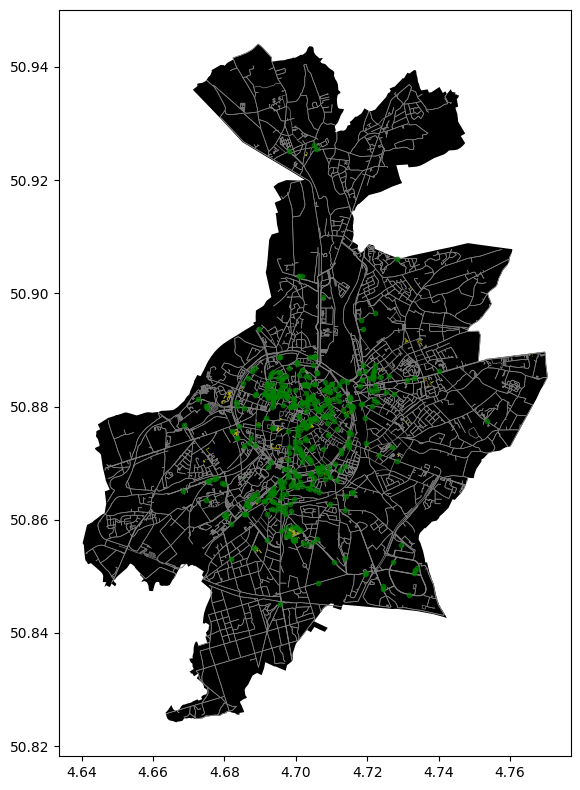

In [9]:
fig, ax = plt.subplots(figsize=(8,8))

# Plot the footprint
area.plot(ax=ax, facecolor='black', zorder=0)

# Plot street edges
edges.plot(ax=ax, linewidth=0.5, edgecolor='grey', zorder=1)

# Plot buildings
buildings.plot(ax=ax, facecolor='yellow', alpha=0.7, zorder=2)

# Plot bicycle parkings
parks.plot(ax=ax, color='green', alpha=0.7, markersize=10, zorder=3)


plt.tight_layout()
plt.axis('on')

## Generic Examples

In the following you will find examples of recurring functions of OSMnx which could be useful later on in the realization of the challenges:

In [ ]:
# Download entities, such as local amenities, points of interest, or building footprints, and turn them into a GeoDataFrame.
def osmnx_networks_by_tags(place, tags):
    p = place
    t = tags
    gdf = ox.geometries_from_place(p, t)
    gdf.shape
    fig, ax = ox.plot_footprints(gdf, figsize=(3, 3))

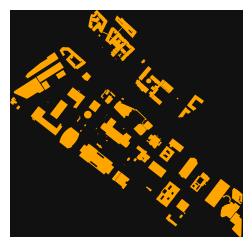

In [ ]:
# get all building footprints in some neighborhood
osmnx_networks_by_tags("Civic Center, Los Angeles, California", {"building": True})

In [ ]:
# Download/model a street network for some city then visualize it
def osmnx_street_networks(city):
    G = ox.graph_from_place(city, network_type="drive")
    fig, ax = ox.plot_graph(G)
    return G

In [ ]:
# Convert a graph to node and edge GeoPandas GeoDataFrames
def osmnx_graph_conversion(graph):
    gdf_nodes, gdf_edges = ox.graph_to_gdfs(graph)
    return gdf_nodes

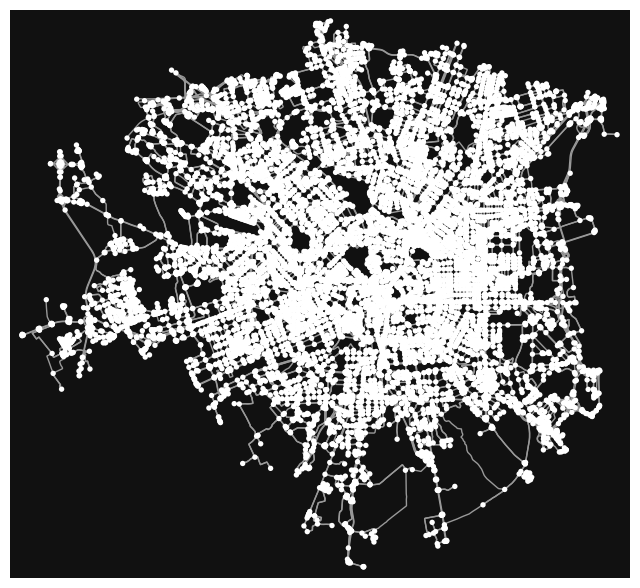

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
10371529,45.487563,9.076625,3,NaN,NaN,POINT (9.07662 45.48756)
10371530,45.479813,9.102055,3,NaN,NaN,POINT (9.10205 45.47981)
13595397,45.499516,9.130656,4,traffic_signals,NaN,POINT (9.13066 45.49952)
13598756,45.482757,9.163773,4,NaN,NaN,POINT (9.16377 45.48276)
13598788,45.487319,9.157376,3,NaN,NaN,POINT (9.15738 45.48732)


In [ ]:
#In our example, OSMnx geocodes the query "Milan, Italy" to retrieve the place boundaries of that city
#from the Nominatim API, retrieves the drivable street network data within those boundaries from the Overpass API, 
#constructs a graph model, then simplifies/corrects its topology such that nodes represent intersections and dead-ends 
#and edges represent the street segments linking them.

G = osmnx_street_networks("Milan, Italy")
gdf_nodes = osmnx_graph_conversion(G)
gdf_nodes.head()

In [ ]:
# Show some basic stats about the network (what sized area does the network cover in square meters,etc.)
def osmnx_basic_street_network_stats(graph):
    G_proj = ox.project_graph(graph)
    nodes_proj = ox.graph_to_gdfs(G_proj, edges=False)
    graph_area_m = nodes_proj.unary_union.convex_hull.area
    print("size area: " +str(graph_area_m))
    stats= ox.basic_stats(G_proj, area=graph_area_m, clean_int_tol=15)
    return stats

In [ ]:
# Get network by address, coordinates, bounding box, or any custom polygon
def osmnx_networks_other_ways(center, distance, graph):
    center_point = center # the (lat, lng) center point around which to construct the graph
    dist = distance # retain only those nodes within this many meters of the center of the graph, 
                    # with distance determined according to dist_type argument
    G = ox.graph_from_point(center_point, dist=dist, network_type="drive")
    fig, ax = ox.plot_graph(graph, node_size=0)

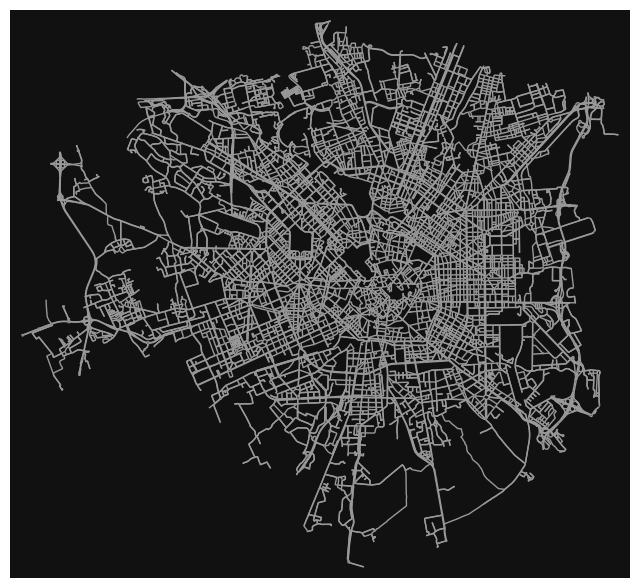

In [ ]:
osmnx_networks_other_ways((37.870605, -122.254830), 1609, G)

In [ ]:
def osmnx_networks_by_custom_filter(city, filters):
    G = ox.graph_from_place(
        city,
        retain_all=False,
        truncate_by_edge=True,
        simplify=True,
        custom_filter=filters,)
    fig, ax = ox.plot_graph(G, node_size=0, edge_color="w", edge_linewidth=0.2)

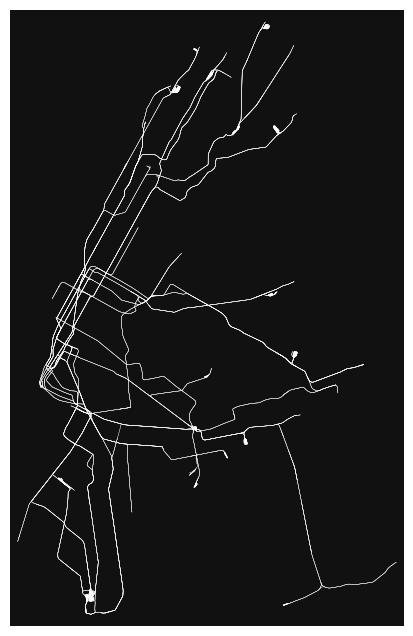

In [ ]:
# For our example, we try to get NY subway rail network
osmnx_networks_by_custom_filter("New York, New York, USA", '["railway"~"subway"]')